# Бейзлайн

In [1]:
# проверяем, что видеокарта подключена
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-eae00720-b5c4-7ed9-a5a1-80b3eb25fb3d)


In [1]:
# подготавливаем данные

# для Google Colab:
!gsutil cp gs://oleg-zyablov/skillfactory/sf-dl-car-classification.zip .
!unzip sf-dl-car-classification.zip
!unzip -q -o sf-dl-car-classification/train.zip
!unzip -q -o sf-dl-car-classification/test.zip
sample_submission_path = '/content/sf-dl-car-classification/sample-submission.csv'
train_path = '/content/train/'
train_patch = '/content/gdrive/MyDrive/PYTHON/SkillFactory/Data Science/Нейронные сети/avto/' # тут добавим путь до спарсенных нами авто
sub_path = '/content/test_upload/'

# для Kaggle Kernel
# !mkdir /kaggle/temp #папка для временных файлов
# !unzip /kaggle/input/train.zip -d /kaggle/temp
# !unzip /kaggle/input/test.zip -d /kaggle/temp
# sample_submission_path = '/kaggle/input/sample-submission.csv'
# train_path = '/kaggle/temp/train/'
# sub_path = '/kaggle/temp/test_upload/'
# %cd /kaggle/working  #переходим в рабочую директорию

#имена классов
class_names = [
  'Приора', #0
  'Ford Focus', #1
  'Самара', #2
  'ВАЗ-2110', #3
  'Жигули', #4
  'Нива', #5
  'Калина', #6
  'ВАЗ-2109', #7
  'Volkswagen Passat', #8
  'ВАЗ-21099' #9
]

Copying gs://oleg-zyablov/skillfactory/sf-dl-car-classification.zip...
/ [1 files][  1.6 GiB/  1.6 GiB]   65.0 MiB/s                                   
Operation completed over 1 objects/1.6 GiB.                                      
Archive:  sf-dl-car-classification.zip
   creating: sf-dl-car-classification/
  inflating: sf-dl-car-classification/sample-submission.csv  
  inflating: sf-dl-car-classification/train.csv  
 extracting: sf-dl-car-classification/test.zip  
 extracting: sf-dl-car-classification/train.zip  


In [2]:
# импорты

import os, re, math, random, time, gc, string, pickle, shutil, pathlib, itertools
import numpy as np, pandas as pd, matplotlib.pyplot as plt, PIL

import tensorflow as tf
#import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import *
from tensorflow.keras.activations import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.layers import *
from tensorflow.keras.layers.experimental.preprocessing import *
from tensorflow.keras.losses import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.optimizers.schedules import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from PIL import Image
from IPython.display import clear_output
from tqdm.notebook import tqdm

!pip install -U git+https://github.com/albumentations-team/albumentations

  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-ltetk079
  Running command git clone -q https://github.com/albumentations-team/albumentations /tmp/pip-req-build-ltetk079
     |████████████████████████████████| 47.7 MB 2.1 MB/s 
  Created wheel for albumentations: filename=albumentations-1.1.0-py3-none-any.whl size=112536 sha256=fefe6b50f4cd1aec024edf6836d347f0a8b549073c50ed8ee4782fe9f6cd7077
  Stored in directory: /tmp/pip-ephem-wheel-cache-toav01ys/wheels/3a/25/ed/ec3b518e7a332d7f0a3bb37c280e1b784cf2f79b94b3c7d00b
Successfully built albumentations
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
# Подключим Google дмск
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**Создаем генераторы изображений**

In [3]:

image_size = (224, 224)
batch_size = 32
LR = 0.0001
train_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.2,
    # ниже параметры аугментаций:
    horizontal_flip=True,
    #vertical_flip=True,
    rotation_range=10,
    #shear_range=0.2,
    #zoom_range=0.3,
    #brightness_range=(0.8, 1.2),
)

val_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.25,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255
)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='training'
)

val_generator = val_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='validation'
)

sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)

Found 12452 images belonging to 10 classes.
Found 3886 images belonging to 10 classes.
Found 6675 validated image filenames.


Train:


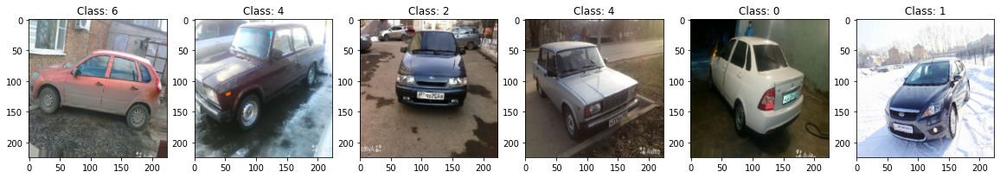

Val:


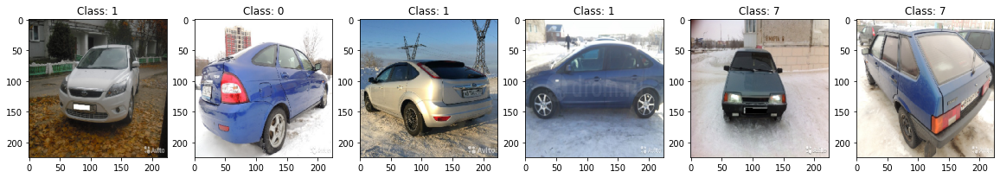

Sub:


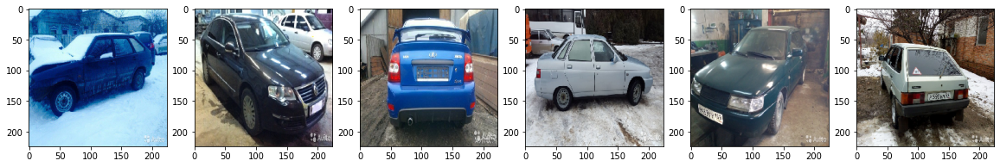

In [4]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(train_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [53]:
# строим модель
model_1 = Sequential([
  EfficientNetB5(weights='imagenet', input_shape=(*image_size, 3), include_top=False), #предобученная нейросеть из модуля keras.applications
  GlobalMaxPool2D(),
  Dropout(0.5),
  Dense(10)
])

model_1.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

115277824/115263384 [==============================] - 2s 0us/step


In [54]:
# обучаем модель
history = model_1.fit(train_generator, validation_data=val_generator, epochs=25)

Epoch 1/25
390/390 [==============================] - 355s 857ms/step - loss: 0.9333 - accuracy: 0.7330 - val_loss: 0.2489 - val_accuracy: 0.9151
Epoch 2/25
390/390 [==============================] - 302s 775ms/step - loss: 0.2317 - accuracy: 0.9242 - val_loss: 0.1419 - val_accuracy: 0.9534
Epoch 3/25
390/390 [==============================] - 320s 820ms/step - loss: 0.1268 - accuracy: 0.9538 - val_loss: 0.1289 - val_accuracy: 0.9557
Epoch 4/25
390/390 [==============================] - 302s 773ms/step - loss: 0.0763 - accuracy: 0.9707 - val_loss: 0.1169 - val_accuracy: 0.9622
Epoch 5/25
390/390 [==============================] - 302s 774ms/step - loss: 0.0535 - accuracy: 0.9792 - val_loss: 0.1108 - val_accuracy: 0.9647
Epoch 6/25
390/390 [==============================] - 302s 774ms/step - loss: 0.0364 - accuracy: 0.9859 - val_loss: 0.1173 - val_accuracy: 0.9678
Epoch 7/25
390/390 [==============================] - 302s 773ms/step - loss: 0.0291 - accuracy: 0.9893 - val_loss: 0.1283 -

In [55]:
scores = model_1.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

122/122 [==============================] - 23s 189ms/step - loss: 0.1511 - accuracy: 0.9709
Accuracy: 97.09%


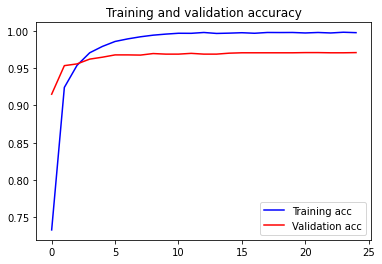

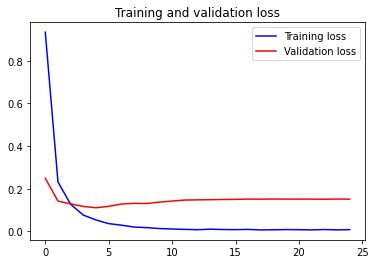

In [56]:
# После каждого обучения буедм визуализировать процесс обучения, это удобно, т.к. видно где и когда переобучаемся а также есть необходимость в увеличении эпох или необходимо их уменьшить
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [ ]:
# Поменяем размер картинки и уменьшим batch_size. Возьмем другую модель из keras.
image_size = (320, 320)
batch_size = 16
train_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.3,
    # ниже параметры аугментаций:
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    shear_range=0.3,
    zoom_range=0.2,
    brightness_range=(0.8, 1.2),
)

val_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.15,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255
)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='training'
)

val_generator = val_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='validation'
)

sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)

Found 10897 images belonging to 10 classes.
Found 2329 images belonging to 10 classes.
Found 6675 validated image filenames.


Train:


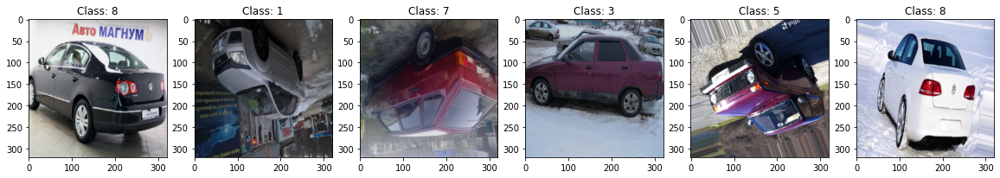

Val:


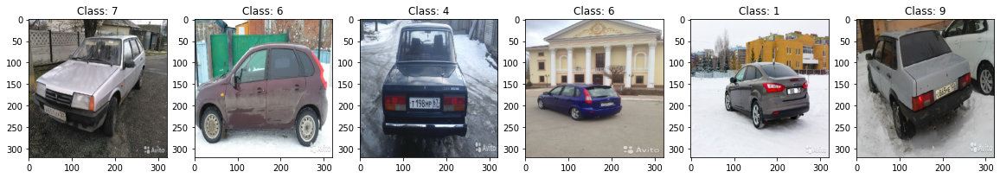

Sub:


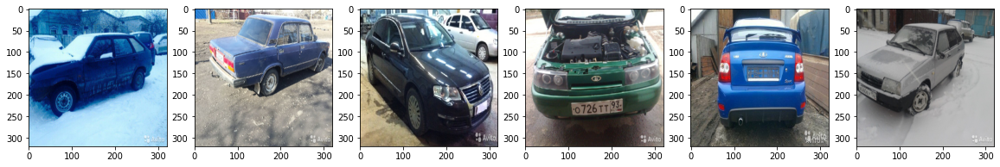

In [ ]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(train_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [58]:
# Попробуем взять другую модель efficientNetB2
model_2 = Sequential([
  EfficientNetB2(weights='imagenet', input_shape=(*image_size, 3), include_top=False), #предобученная нейросеть из модуля keras.applications
  GlobalMaxPool2D(),
  Dropout(0.5),
  Dense(10)
])

model_2.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

In [59]:
history = model_2.fit(train_generator, validation_data=val_generator, epochs=25)

Epoch 1/25
390/390 [==============================] - 415s 1s/step - loss: 1.1370 - accuracy: 0.7381 - val_loss: 0.1880 - val_accuracy: 0.9352
Epoch 2/25
390/390 [==============================] - 403s 1s/step - loss: 0.1889 - accuracy: 0.9345 - val_loss: 0.1455 - val_accuracy: 0.9565
Epoch 3/25
390/390 [==============================] - 402s 1s/step - loss: 0.1102 - accuracy: 0.9604 - val_loss: 0.1212 - val_accuracy: 0.9614
Epoch 4/25
390/390 [==============================] - 401s 1s/step - loss: 0.0791 - accuracy: 0.9710 - val_loss: 0.1271 - val_accuracy: 0.9617
Epoch 5/25
390/390 [==============================] - 401s 1s/step - loss: 0.0636 - accuracy: 0.9780 - val_loss: 0.1160 - val_accuracy: 0.9671
Epoch 6/25
390/390 [==============================] - 400s 1s/step - loss: 0.0464 - accuracy: 0.9851 - val_loss: 0.1162 - val_accuracy: 0.9673
Epoch 7/25
390/390 [==============================] - 401s 1s/step - loss: 0.0362 - accuracy: 0.9855 - val_loss: 0.1185 - val_accuracy: 0.9686

In [60]:
scores = model_2.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100)) 

122/122 [==============================] - 25s 205ms/step - loss: 0.1277 - accuracy: 0.9725
Accuracy: 97.25%


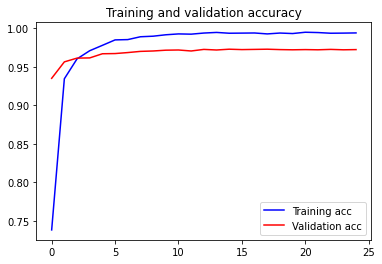

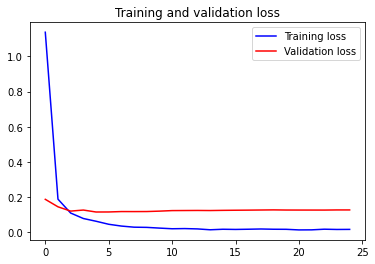

In [61]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [5]:
# увеличим batch_size
image_size = (320, 320)
batch_size = 32
LR = 0.0001
train_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.2,
    # ниже параметры аугментаций:
    horizontal_flip=True,
    #vertical_flip=True,
    rotation_range=10,
    #shear_range=0.2,
    #zoom_range=0.3,
    #brightness_range=(0.8, 1.2),
)

val_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.25,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255
)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='training'
)

val_generator = val_datagen.flow_from_directory(
    train_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='validation'
)

sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)

Found 12452 images belonging to 10 classes.
Found 3886 images belonging to 10 classes.
Found 6675 validated image filenames.


Train:


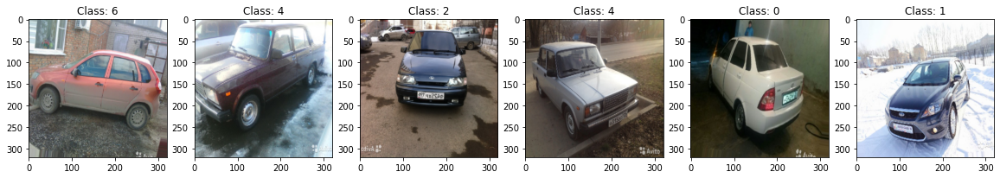

Val:


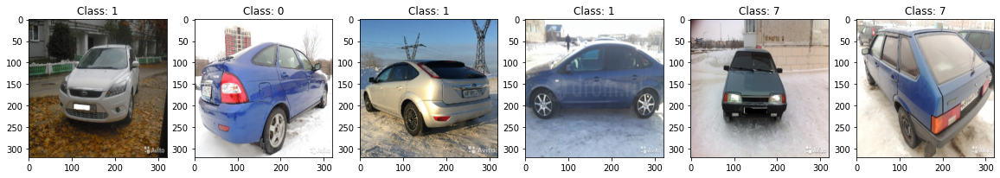

Sub:


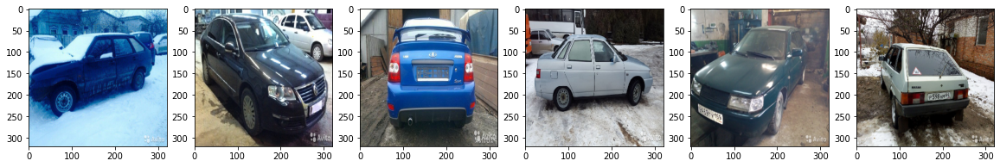

In [6]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(train_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [6]:
# Попробуем обучать с постепенной разморозкой основной модели, сначала соберем и скомпилируем модель
model_3 = Sequential([
  EfficientNetB2(weights='imagenet', input_shape=(*image_size, 3), include_top=False), #предобученная нейросеть из модуля keras.applications
  GlobalMaxPool2D(),
  Dropout(0.5),
  Dense(10)
])

model_3.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

31801344/31790344 [==============================] - 0s 0us/step


In [ ]:
# проверим статус слоев
for layer in model_3.layers:
    print(layer, layer.trainable)

<keras.engine.functional.Functional object at 0x7f05f09c5e90> True
<keras.layers.pooling.GlobalMaxPooling2D object at 0x7f061c4ce410> True
<keras.layers.core.dropout.Dropout object at 0x7f05fd7bafd0> True
<keras.layers.core.dense.Dense object at 0x7f05fcbfb750> True


In [ ]:
# Замораживаем основную модель 

model_3.layers[0].trainable=False

In [ ]:
# проверим что основная модель заморожена
for layer in model_3.layers:
    print(layer, layer.trainable)

<keras.engine.functional.Functional object at 0x7f63b8a84390> False
<keras.layers.pooling.GlobalMaxPooling2D object at 0x7f6444853c10> True
<keras.layers.core.dropout.Dropout object at 0x7f63b815a490> True
<keras.layers.core.dense.Dense object at 0x7f63b8fc8410> True


In [ ]:
model_3.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

In [ ]:
# Проверим состояние слоев головы
model_3.get_config()

In [ ]:
# Запускаем обучение
history = model_3.fit(train_generator, validation_data=val_generator, epochs=25)

In [ ]:
scores = model_3.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [ ]:
# Хорошо, получили модель с процентом точности заметно ниже, чем ранее обучали с основной моделью. Разморозим половину слоев головной модели и дообучим модель
model_3.layers[0].trainable= True
fine_tune_at = len(model_3.layers[0].layers) // 2
for layer in model_3.layers[0].layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
model_3.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

In [ ]:
history = model_3.fit(train_generator, validation_data=val_generator, epochs=25)

In [ ]:
scores = model_3.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [ ]:
model_3.layers[0].trainable=True

In [ ]:
model_3.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

In [7]:
history = model_3.fit(train_generator, validation_data=val_generator, epochs=25)

Epoch 1/25
390/390 [==============================] - 446s 1s/step - loss: 1.1041 - accuracy: 0.7383 - val_loss: 0.2016 - val_accuracy: 0.9334
Epoch 2/25
390/390 [==============================] - 401s 1s/step - loss: 0.1929 - accuracy: 0.9360 - val_loss: 0.1514 - val_accuracy: 0.9475
Epoch 3/25
390/390 [==============================] - 400s 1s/step - loss: 0.1164 - accuracy: 0.9605 - val_loss: 0.1312 - val_accuracy: 0.9606
Epoch 4/25
390/390 [==============================] - 400s 1s/step - loss: 0.0805 - accuracy: 0.9705 - val_loss: 0.1098 - val_accuracy: 0.9635
Epoch 5/25
390/390 [==============================] - 400s 1s/step - loss: 0.0583 - accuracy: 0.9782 - val_loss: 0.1124 - val_accuracy: 0.9660
Epoch 6/25
390/390 [==============================] - 402s 1s/step - loss: 0.0428 - accuracy: 0.9845 - val_loss: 0.1178 - val_accuracy: 0.9701
Epoch 7/25
390/390 [==============================] - 401s 1s/step - loss: 0.0339 - accuracy: 0.9867 - val_loss: 0.1148 - val_accuracy: 0.9696

In [47]:
scores = model_3.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

NameError: ignored

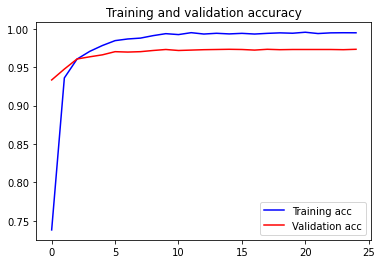

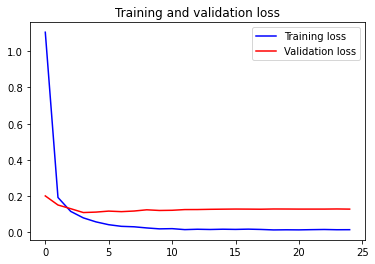

In [9]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [12]:
# Попробуем обучить с основной моделью без заморозки слоев. Сократим только количество эпох до 20, т.к. далее идем переобучение уже
model_4 = Sequential([
  EfficientNetB2(weights='imagenet', input_shape=(*image_size, 3), include_top=False), #предобученная нейросеть из модуля keras.applications
  GlobalMaxPool2D(),
  Dropout(0.5),
  Dense(10)
])

model_4.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)


In [13]:
# Обучим модель на 11 эпохах, их до
history = model_4.fit(train_generator, validation_data=val_generator, epochs=11)

Epoch 1/11
390/390 [==============================] - 419s 1s/step - loss: 1.1259 - accuracy: 0.7495 - val_loss: 0.1540 - val_accuracy: 0.9431
Epoch 2/11
390/390 [==============================] - 407s 1s/step - loss: 0.1866 - accuracy: 0.9360 - val_loss: 0.1303 - val_accuracy: 0.9534
Epoch 3/11
390/390 [==============================] - 406s 1s/step - loss: 0.1110 - accuracy: 0.9615 - val_loss: 0.1301 - val_accuracy: 0.9583
Epoch 4/11
390/390 [==============================] - 405s 1s/step - loss: 0.0770 - accuracy: 0.9725 - val_loss: 0.1055 - val_accuracy: 0.9671
Epoch 5/11
390/390 [==============================] - 406s 1s/step - loss: 0.0549 - accuracy: 0.9797 - val_loss: 0.0988 - val_accuracy: 0.9691
Epoch 6/11
390/390 [==============================] - 405s 1s/step - loss: 0.0421 - accuracy: 0.9838 - val_loss: 0.0991 - val_accuracy: 0.9712
Epoch 7/11
390/390 [==============================] - 404s 1s/step - loss: 0.0329 - accuracy: 0.9867 - val_loss: 0.1099 - val_accuracy: 0.9709

In [46]:
scores = model_4.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

146/146 [==============================] - 26s 177ms/step - loss: 0.1298 - accuracy: 0.9623
Accuracy: 96.23%


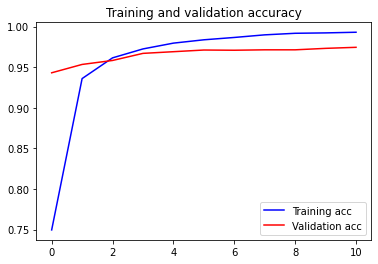

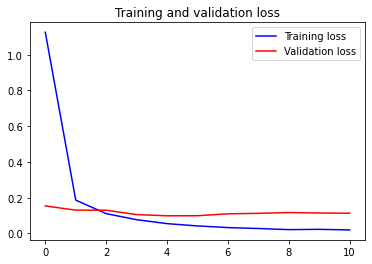

In [15]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

В итоге видим, что с разморозкой и разморозкой слоев получает небольшой прирост в качестве модели

Train:


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


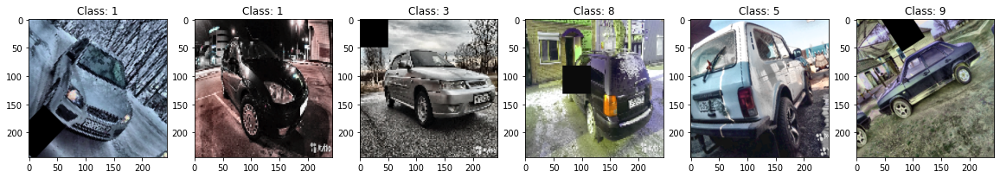

Val:


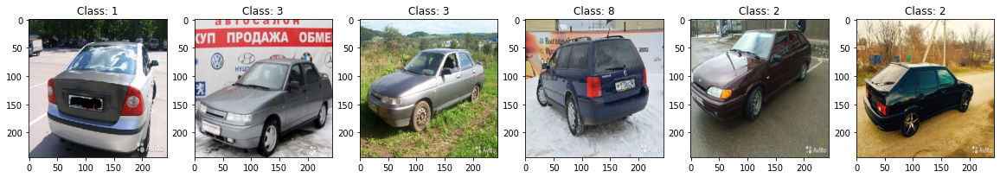

Sub:


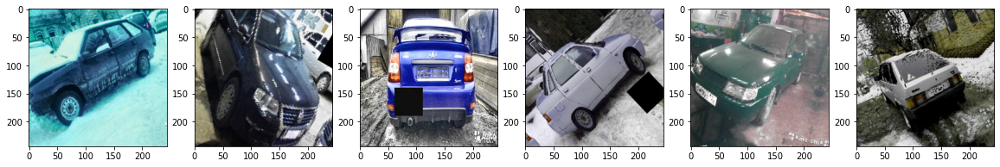

In [11]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(my_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [ ]:
!pip install -U git+https://github.com/albumentations-team/albumentations

  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-6zb24cws
  Running command git clone -q https://github.com/albumentations-team/albumentations /tmp/pip-req-build-6zb24cws


In [8]:
!pip uninstall opencv-python-headless

Found existing installation: opencv-python-headless 4.5.5.62
Uninstalling opencv-python-headless-4.5.5.62:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.5.62.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-64ac49e1.so.58.91.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-4b79e479.so.58.45.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-805734e8.so.56.51.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-018b8c17.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libgfortran-91cc3cb1.so.3.0.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libopenblas-r0-f650aae0.3.3.so
    /usr/local/lib/python3.7/dist

In [9]:
!pip install opencv-python-headless==4.1.2.30

     |████████████████████████████████| 21.8 MB 1.3 MB/s 


Found 13232 images belonging to 10 classes.
Found 4664 images belonging to 10 classes.
Found 6675 validated image filenames.


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


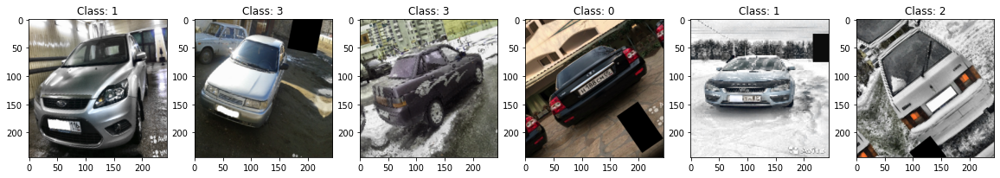

Found 13232 images belonging to 10 classes.
Found 4664 images belonging to 10 classes.
Found 6675 validated image filenames.


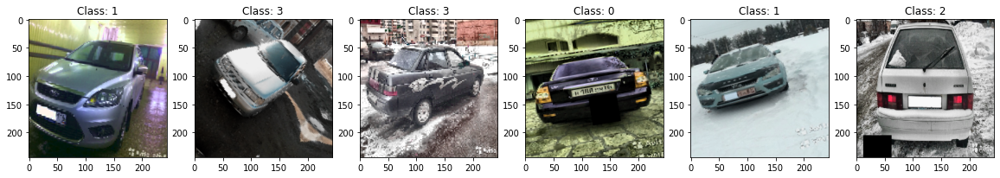

Found 13232 images belonging to 10 classes.
Found 4664 images belonging to 10 classes.
Found 6675 validated image filenames.


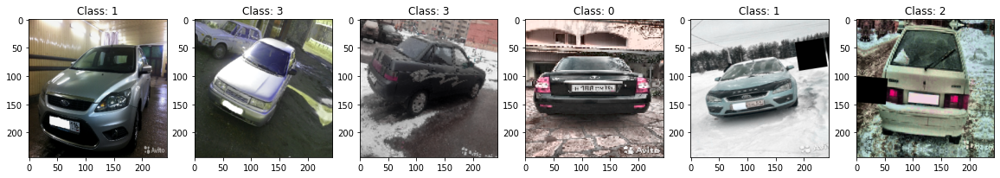

In [10]:
# Попробуем обучить применив аугментацию с несколькими параметрами, т.е. изображения будут вращаться по верткали, горизонтали а также менять цвет, добавляться различные искажения. Возможно полсе данной аукментации обучение модели будет происходить значительно дольше, попробуем добавить больше изменений в изображения и посмотрим, как будет проходить процесс обучения

import albumentations as A

image_size = (244, 244)
batch_size = 32
LR = 0.0001
def augment(image):
  image = image.astype(np.uint8)
  aug = A.Compose([
      A.Cutout(p=0.5, num_holes=1, max_h_size=50, max_w_size=50),
      #A.Cutout(p=0.5, num_holes=1, max_h_size=100, max_w_size=150), #второй раз
      #A.Cutout(p=0.5, num_holes=1, max_h_size=80, max_w_size=100), #третий раз
      #A.Blur(blur_limit=9, p=0.5), # Размытие входного изображения
      #A.ChannelDropout(channel_drop_range=(1, 1), fill_value=0, always_apply=False, p=0.5), # Случайным образом перетащите каналы во входное изображение
      #A.ChannelShuffle(), # Произвольно переставьте каналы входного изображения RGB
      A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=0.5), # Примените коррекцию адаптивной гистограммы с ограничением контраста к входному изображению
      #A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, always_apply=False, p=0.5), # Слчайным образом инменяеи яркость, насышенность, контраст изображения
      #A.CoarseDropout(max_holes=6, max_height=6, max_width=6, min_holes=None, min_height=None, min_width=None, fill_value=0, mask_fill_value=None, always_apply=False, p=0.5), # выпадение прямоугольных областей изображения 
      A.Downscale(scale_min=0.5, scale_max=0.5, interpolation=0, always_apply=False, p=0.5), # Уменьшает качество изображения за счет уменьшения и обратного увеличения
      #A.Emboss(alpha=(0.1, 0.4), strength=(0.1, 0.5), always_apply=False, p=0.5),
      #A.Flip(), # Отразите вход по горизонтали, вертикали или по горизонтали и вертикали
      #A.GaussNoise(var_limit=(70, 450), mean=-60),
      #A.HueSaturationValue(hue_shift_limit=40, sat_shift_limit=40, val_shift_limit=40),
      #A.HorizontalFlip(p=0.5),
      A.ShiftScaleRotate(p=0.7),
      A.HueSaturationValue(p=1),
      # Читайте документацию прежде чем копировать и использовать этот код!
      # https://albumentations.ai/docs/api_reference/augmentations/transforms/
      # https://albumentations.ai/docs/examples/example/
      # Данный набор аугментаций - лишь пример
      # Подумайте сами как будет лучше, почитайте статьи в интернете по этой теме
  ])
  return aug(image=image)['image']

my_datagen = ImageDataGenerator(
    validation_split=0.15,
     #rescale=1/255,
    preprocessing_function=augment,   
)
val_datagen = ImageDataGenerator(
    validation_split=0.3,
    #rescale=1/255,
   # preprocessing_function=augment,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255,
    preprocessing_function=augment,
)
for _ in range(3):
  my_generator = my_datagen.flow_from_directory(
      train_path,
      target_size=image_size,
      batch_size=batch_size,
      shuffle=True,
      seed=0,
      subset='training'
  )
  val_generator = val_datagen.flow_from_directory(
      train_path,
      target_size=image_size,
      batch_size=batch_size,
      shuffle=True,
      seed=0,
      subset='validation'
  )
  sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)
 
  show_first_images(my_generator)

In [19]:
# попробуем применить модель DenseNet169 с аугментацией

tf.keras.applications.densenet.preprocess_input
model_5 = Sequential([
  DenseNet169(weights='imagenet', input_shape=(*image_size, 3), include_top=False, pooling='avg'), #предобученная нейросеть из модуля keras.applications
  #GlobalMaxPool2D(),
  #Dropout(0.5),
  Dense(10)
])

model_5.compile(
    #loss=SparseCategoricalCrossentropy(from_logits=True),
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    metrics='accuracy'
)

In [20]:
history = model_5.fit(my_generator, validation_data=val_generator, epochs=25)

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


Epoch 1/25
414/414 [==============================] - 178s 395ms/step - loss: 1.6992 - accuracy: 0.3814 - val_loss: 1.4673 - val_accuracy: 0.5390
Epoch 2/25
414/414 [==============================] - 162s 390ms/step - loss: 0.6925 - accuracy: 0.7423 - val_loss: 0.5811 - val_accuracy: 0.7980
Epoch 3/25
414/414 [==============================] - 161s 390ms/step - loss: 0.4083 - accuracy: 0.8498 - val_loss: 0.2018 - val_accuracy: 0.9256
Epoch 4/25
414/414 [==============================] - 163s 394ms/step - loss: 0.2767 - accuracy: 0.8962 - val_loss: 0.1655 - val_accuracy: 0.9428
Epoch 5/25
414/414 [==============================] - 162s 391ms/step - loss: 0.2066 - accuracy: 0.9217 - val_loss: 0.1385 - val_accuracy: 0.9483
Epoch 6/25
414/414 [==============================] - 161s 389ms/step - loss: 0.1621 - accuracy: 0.9395 - val_loss: 0.1159 - val_accuracy: 0.9595
Epoch 7/25
414/414 [==============================] - 163s 394ms/step - loss: 0.1350 - accuracy: 0.9505 - val_loss: 0.0986 -

In [45]:
scores = model_5.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100)) 

NameError: ignored

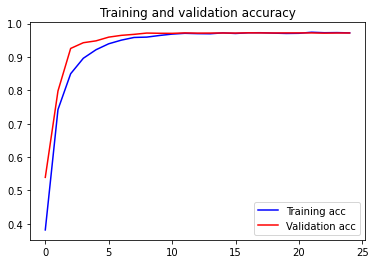

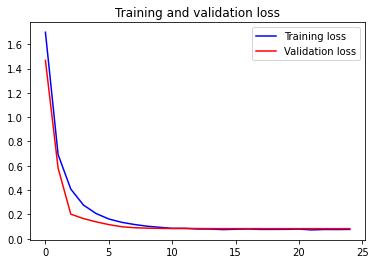

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [36]:
# Сформируем модель с callback настройками
# добавим callbacks и попробуем управлять скоростью. В частности будем сохранять лучшую модель, на основе полученных характеристик, если в течении 5 этох нет програсса в улучшении показателей, то прекращаем обучение а также будкм уменьшать скорость обучения если показатели перестали расти  

model_6 = Sequential([
  DenseNet169(weights='imagenet', input_shape=(*image_size, 3), include_top=False, pooling='avg'), #предобученная нейросеть из модуля keras.applications
  #GlobalMaxPool2D(),
  #Dropout(0.5),
  Dense(10)
])
model_6.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    #optimizer=Adam(learning_rate=ExponentialDecay(
     #             0.0009, decay_steps=100, decay_rate=0.9)),
    #optimizer=Adam(ExponentialDecay(1e-3, 100, 0.9)),
    optimizer='adam',
    metrics=['accuracy']
)
my_callbacks = [
    ModelCheckpoint('best_model.hdf5' , monitor = 'val_acc', verbose = 2  , mode = 'max', save_best_only=True),
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
]

In [37]:
# запустим обучение, увеличим количество эпох, так как стоит остановка обучения если нет прогресса 
history = model_6.fit(train_generator, validation_data=val_generator, epochs=45, verbose=1, callbacks = [my_callbacks])

Epoch 1/45
390/390 [==============================] - 392s 965ms/step - loss: 0.6450 - accuracy: 0.7702 - val_loss: 2.0168 - val_accuracy: 0.6430 - lr: 0.0010
Epoch 2/45
390/390 [==============================] - 371s 950ms/step - loss: 0.2994 - accuracy: 0.8956 - val_loss: 0.9915 - val_accuracy: 0.7650 - lr: 0.0010
Epoch 3/45
390/390 [==============================] - 372s 953ms/step - loss: 0.2259 - accuracy: 0.9210 - val_loss: 0.8754 - val_accuracy: 0.7747 - lr: 0.0010
Epoch 4/45
390/390 [==============================] - 374s 959ms/step - loss: 0.1885 - accuracy: 0.9354 - val_loss: 1.1798 - val_accuracy: 0.7952 - lr: 0.0010
Epoch 5/45
390/390 [==============================] - 373s 955ms/step - loss: 0.1857 - accuracy: 0.9366 - val_loss: 1.0707 - val_accuracy: 0.7736 - lr: 0.0010
Epoch 6/45
390/390 [==============================] - 374s 958ms/step - loss: 0.1563 - accuracy: 0.9453 - val_loss: 1.1098 - val_accuracy: 0.7618 - lr: 0.0010
Epoch 7/45
390/390 [==========================

In [38]:
scores = model_6.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100)) 

146/146 [==============================] - 26s 180ms/step - loss: 0.3723 - accuracy: 0.9172
Accuracy: 91.72%


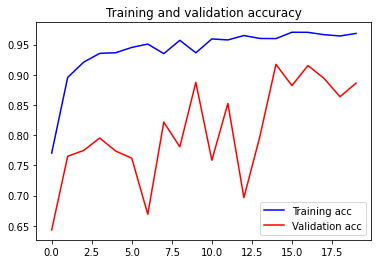

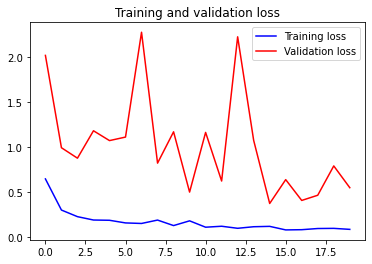

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

Проведем обучение на спарсенных данных с сайта auto.ru, ноутбук по парсингу закинул на GitHub

Train:


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


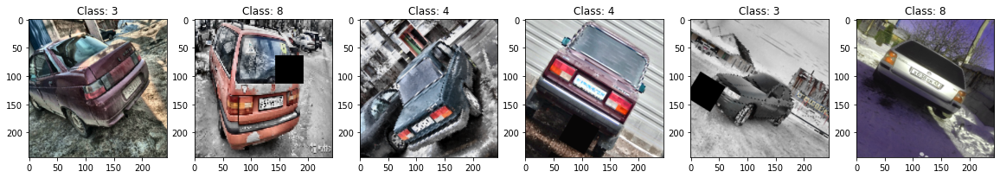

Val:


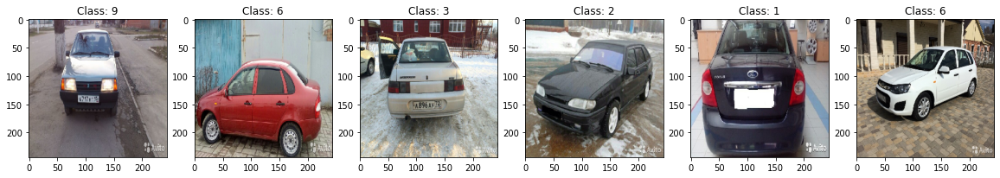

Sub:


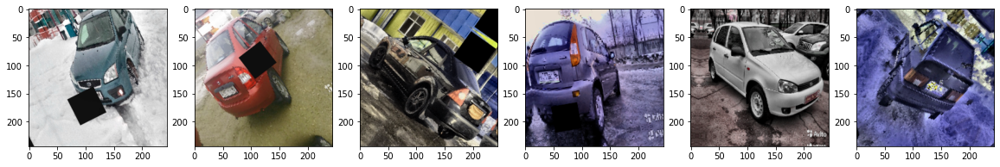

In [12]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(my_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [14]:
# проведем обучение на спарсенных изображениях
# уменьшим batch_size до 16, т.к. большие не помещаются, увеличим размер изображения
#import albumentations as A

image_size = (490, 490)
batch_size = 16
LR = 0.0001
def augment(image):
  image = image.astype(np.uint8)
  aug = A.Compose([
      #A.Cutout(p=0.5, num_holes=1, max_h_size=50, max_w_size=50),
      #A.Cutout(p=0.5, num_holes=1, max_h_size=100, max_w_size=150), #второй раз
      A.Cutout(p=0.5, num_holes=1, max_h_size=80, max_w_size=100), #третий раз
      A.Blur(blur_limit=9, p=0.5), # Размытие входного изображения
      A.ChannelDropout(channel_drop_range=(1, 1), fill_value=0, always_apply=False, p=0.5), # Случайным образом перетащите каналы во входное изображение
      A.ChannelShuffle(), # Произвольно переставьте каналы входного изображения RGB
      A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=0.5), # Примените коррекцию адаптивной гистограммы с ограничением контраста к входному изображению
      #A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, always_apply=False, p=0.5), # Слчайным образом инменяеи яркость, насышенность, контраст изображения
      #A.CoarseDropout(max_holes=6, max_height=6, max_width=6, min_holes=None, min_height=None, min_width=None, fill_value=0, mask_fill_value=None, always_apply=False, p=0.5), # выпадение прямоугольных областей изображения 
      A.Downscale(scale_min=0.5, scale_max=0.5, interpolation=0, always_apply=False, p=0.5), # Уменьшает качество изображения за счет уменьшения и обратного увеличения
      #A.Emboss(alpha=(0.1, 0.4), strength=(0.1, 0.5), always_apply=False, p=0.5),
      #A.Flip(), # Отразите вход по горизонтали, вертикали или по горизонтали и вертикали
      #A.GaussNoise(var_limit=(70, 450), mean=-60),
      #A.HueSaturationValue(hue_shift_limit=40, sat_shift_limit=40, val_shift_limit=40),
      #A.HorizontalFlip(p=0.5),
      A.ShiftScaleRotate(p=0.7),
      A.HueSaturationValue(p=1),
      # Читайте документацию прежде чем копировать и использовать этот код!
      # https://albumentations.ai/docs/api_reference/augmentations/transforms/
      # https://albumentations.ai/docs/examples/example/
      # Данный набор аугментаций - лишь пример
      # Подумайте сами как будет лучше, почитайте статьи в интернете по этой теме
  ])
  return aug(image=image)['image']

my_datagen = ImageDataGenerator(
    validation_split=0.2,
     #rescale=1/255,
    preprocessing_function=augment,   
)
val_datagen = ImageDataGenerator(
    validation_split=0.3,
    #rescale=1/255,
   # preprocessing_function=augment,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255,
    preprocessing_function=augment,
)
for _ in range(3):
  my_generator = my_datagen.flow_from_directory(
      train_patch,
      target_size=image_size,
      batch_size=batch_size,
      shuffle=True,
      seed=0,
      subset='training'
  )
  val_generator = val_datagen.flow_from_directory(
      train_patch,
      target_size=image_size,
      batch_size=batch_size,
      shuffle=True,
      seed=0,
      subset='validation'
  )
  sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)
 
  show_first_images(my_generator)

FileNotFoundError: ignored

In [ ]:
"""image_size = (224, 224)
batch_size = 16
LR = 0.0001
train_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.2,
    # ниже параметры аугментаций:
    horizontal_flip=True,
    #vertical_flip=True,
    #rotation_range=10,
    #shear_range=0.2,
    zoom_range=0.3,
    #brightness_range=(0.8, 1.2),
)

val_datagen = ImageDataGenerator(
    #rescale=1/255,
    validation_split=0.25,
)

sub_datagen = ImageDataGenerator(
    #rescale=1/255
)

train_generator = train_datagen.flow_from_directory(
    train_patch,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='training'
)

val_generator = val_datagen.flow_from_directory(
    train_patch,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=0,
    subset='validation'
)

sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False
)"""

Found 16929 images belonging to 10 classes.
Found 5286 images belonging to 10 classes.
Found 6675 validated image filenames.


Train:


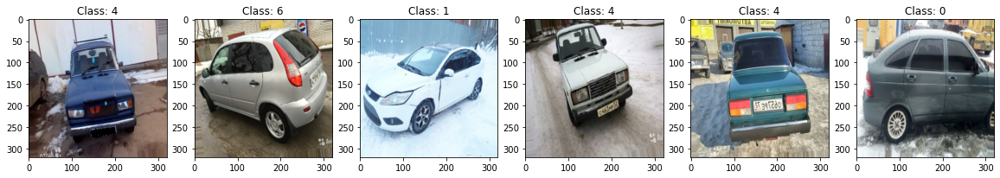

Val:


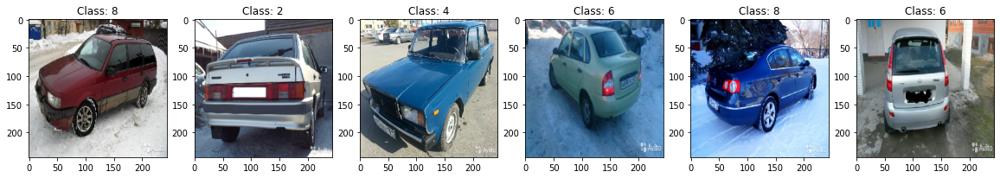

Sub:


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


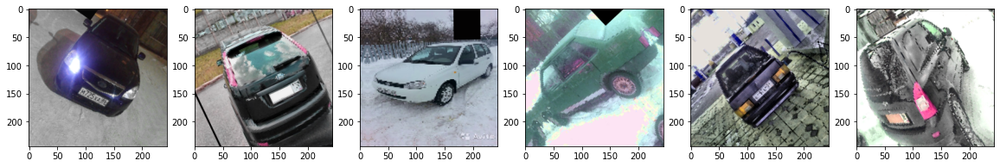

In [15]:
def show_first_images(generator, count=6, labels=True, figsize=(20, 5), normalized=False):
  generator = itertools.islice(generator, count)
  fig, axes = plt.subplots(nrows=1, ncols=count, figsize=figsize)
  for batch, ax in zip(generator, axes):
    if labels:
      img_batch, labels_batch = batch
      img, label = img_batch[0], np.argmax(labels_batch[0]) #берем по одному изображению из каждого батча
    else:
      img_batch = batch
      img = img_batch[0]
    if not normalized:
      img = img.astype(np.uint8)
    ax.imshow(img)
    # метод imshow принимает одно из двух:
    # - изображение в формате uint8, яркость от 0 до 255
    # - изображение в формате float, яркость от 0 до 1
    if labels:
      ax.set_title(f'Class: {label}')
  plt.show()

print('Train:')
show_first_images(train_generator)

print('Val:')
show_first_images(val_generator)

print('Sub:')
show_first_images(sub_generator, labels=False)

In [ ]:
model_7 = Sequential([
  EfficientNetB0(weights='imagenet', input_shape=(*image_size, 3), include_top=False), #предобученная нейросеть из модуля keras.applications
  GlobalMaxPool2D(),
  Dropout(0.5),
  Dense(10)
])
model_7.compile(
    loss=CategoricalCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy'])

16719872/16705208 [==============================] - 0s 0us/step


In [ ]:
history = model_7.fit(my_generator, validation_data=val_generator, epochs=25, verbose=1)

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


Epoch 1/25
1059/1059 [==============================] - 8110s 8s/step - loss: 2.3855 - accuracy: 0.4389 - val_loss: 0.5088 - val_accuracy: 0.8146
Epoch 2/25
1059/1059 [==============================] - 755s 713ms/step - loss: 0.7443 - accuracy: 0.7448 - val_loss: 0.3097 - val_accuracy: 0.8854
Epoch 3/25
1059/1059 [==============================] - 746s 704ms/step - loss: 0.5342 - accuracy: 0.8146 - val_loss: 0.2159 - val_accuracy: 0.9106
Epoch 4/25
1059/1059 [==============================] - 745s 703ms/step - loss: 0.4710 - accuracy: 0.8328 - val_loss: 0.2821 - val_accuracy: 0.9063
Epoch 5/25
1059/1059 [==============================] - 747s 705ms/step - loss: 0.4368 - accuracy: 0.8472 - val_loss: 0.2005 - val_accuracy: 0.9290
Epoch 6/25
1059/1059 [==============================] - 746s 705ms/step - loss: 0.4127 - accuracy: 0.8543 - val_loss: 0.1755 - val_accuracy: 0.9290
Epoch 7/25
1059/1059 [==============================] - 745s 703ms/step - loss: 0.3823 - accuracy: 0.8682 - val_lo

In [ ]:
scores = model_7.evaluate(val_generator, steps=len(val_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100)) 

397/397 [==============================] - 114s 287ms/step - loss: 0.0905 - accuracy: 0.9647
Accuracy: 96.47%


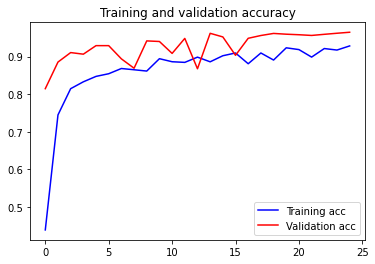

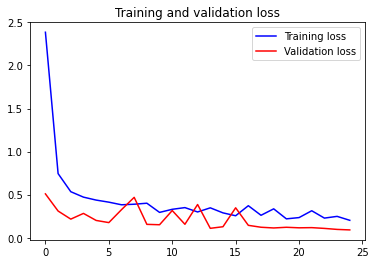

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

На изображениях спарсенных с auto.ru видно, что качество резко падает. Тут как мне кажется, связано с тем, что много дублирующихся изображений, а также присутствуют изображения салона авто, а в некоторых изображения не соответствуют указанным классам. Также я не использую в sub_generator мои спарсенные изображения...не знаю, как тут, правильно ли это? 

TTA применим для улучшения предсказаний

Found 6675 validated image filenames.


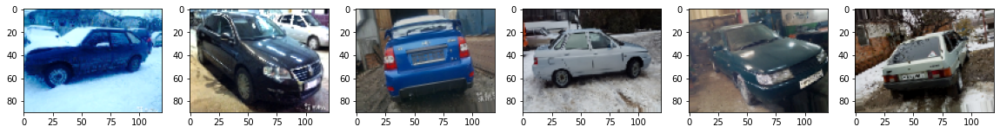

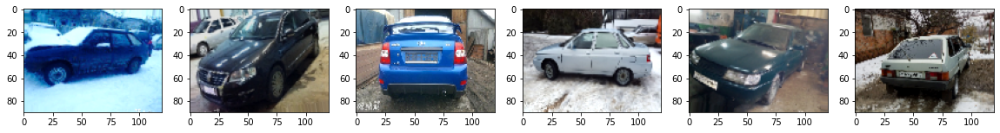

In [62]:
sub_datagen = ImageDataGenerator(
    #rescale=1/255
    horizontal_flip=True,
    rotation_range=10,
    shear_range=0.2,
    brightness_range=(0.8, 1.2)
)

sub_generator = sub_datagen.flow_from_dataframe( 
    dataframe=pd.read_csv(sample_submission_path),
    directory=sub_path,
    x_col="Id",
    y_col=None,
    class_mode=None,
    target_size=(90, 120),
    batch_size=32,
    shuffle=False
)

show_first_images(sub_generator, labels=False)
sub_generator.reset()
show_first_images(sub_generator, labels=False)

In [80]:
# Сделаем предсказания 5 раз

predictions = []
for _ in range(5):
  predictions.append(model_5.predict(sub_generator, verbose=1))
  sub_generator.reset()
predictions = np.array(predictions)
predictions.shape

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


209/209 [==============================] - 54s 258ms/step


(5, 6675, 10)

In [81]:
final_predictions = predictions.mean(axis=0).argmax(axis=-1)
final_predictions

array([7, 6, 4, ..., 1, 3, 4])

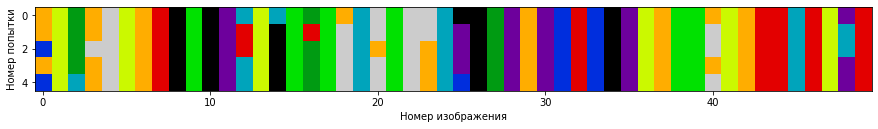

In [82]:
plt.figure(figsize=(15, 3))
plt.imshow(predictions.argmax(axis=-1)[:, :50], cmap='nipy_spectral')
plt.xlabel('Номер изображения')
plt.ylabel('Номер попытки')
plt.show()

In [83]:
# Sumbitting predictions
submission = pd.DataFrame({
    'Id': sub_generator.filenames,
    'Category': final_predictions
}, columns=['Id', 'Category'])
submission.to_csv('submission1.csv', index=False)

In [84]:
# Ансамблирование

predictions_ens = 0.6*model_8.predict(sub_generator) + 0.3*model_2.predict(sub_generator) + 0.2*model_1.predict(sub_generator)
predictions_ens = predictions_ens.argmax(axis=1)
predictions_ens

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/dropout/cutout.py:52: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  FutureWarning,


array([7, 6, 4, ..., 1, 3, 4])

In [63]:
predictions = model_2.predict(sub_generator, verbose=1)
predictions = predictions.argmax(axis=1)

submission = pd.DataFrame({
    'Id': sub_generator.filenames,
    'Category': predictions
}, columns=['Id', 'Category'])
submission.to_csv('submission.csv', index=False)

209/209 [==============================] - 48s 224ms/step


### Ансамблирование

In [66]:
predictions = 0.25*model_2.predict(sub_generator) \
    + 0.15*model_7.predict(sub_generator)
predictions = predictions.argmax(axis=1)
predictions

array([9, 6, 4, ..., 8, 3, 4])

### Получение предсказания модели на изображении

Получить предсказание модели для произвольного изображения можно таким образом:

In [85]:
submission = pd.DataFrame({
    'Id': sub_generator.filenames,
    'Category': predictions_ens
}, columns=['Id', 'Category'])
submission.to_csv('submission2.csv', index=False)

Вывод: в данном проекте я попробовал несколько предобученных моделей, поэкспериментировал с lerning rate, batch size. После нескольких построений модели, были выбраны оптимальных параметры. Также попробовал применить аугментацию для модификации модели. Применил coolback настройки по управлению скоростью, остановкой обучения модели после остановки прогресса.
Сделал парсер изображений с сайта avto.ru, попробовал обучить на данных картинках модель. 